<a href="https://colab.research.google.com/github/PKghose/Brain_Tumor-XAI/blob/main/brain_tumor_seg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import kagglehub
import os
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define your Google Drive path
drive_path = "/content/drive/MyDrive/brain"

# Create the directory if it doesn't exist
os.makedirs(drive_path, exist_ok=True)






Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [10]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("mateuszbuda/lgg-mri-segmentation")

print("Path to dataset files:", path)

100%|██████████| 714M/714M [00:18<00:00, 41.3MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/mateuszbuda/lgg-mri-segmentation/versions/2


In [3]:
!pip install -q segmentation-models-pytorch

import os
import time
from glob import glob
from tqdm import tqdm

import cv2
import numpy as np
import pandas as pd
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import albumentations as A
from scipy.ndimage.morphology import binary_dilation
import segmentation_models_pytorch as smp
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split

import torch
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.3/121.3 kB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 113.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 87.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

<ipython-input-3-22145fdabdf6>:14: DeprecationWarning: Please import `binary_dilation` from the `scipy.ndimage` namespace; the `scipy.ndimage.morphology` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.morphology import binary_dilation


In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Data Preprocessing and loading


In [15]:
files_dir = '/root/.cache/kagglehub/datasets/mateuszbuda/lgg-mri-segmentation/versions/2/kaggle_3m/'
file_paths = glob(f'{files_dir}/*/*[0-9].tif')

In [16]:
csv_path = '/root/.cache/kagglehub/datasets/mateuszbuda/lgg-mri-segmentation/versions/2/kaggle_3m/data.csv'
df = pd.read_csv(csv_path)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110 entries, 0 to 109
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Patient                    110 non-null    object 
 1   RNASeqCluster              92 non-null     float64
 2   MethylationCluster         109 non-null    float64
 3   miRNACluster               110 non-null    int64  
 4   CNCluster                  108 non-null    float64
 5   RPPACluster                98 non-null     float64
 6   OncosignCluster            105 non-null    float64
 7   COCCluster                 110 non-null    int64  
 8   histological_type          109 non-null    float64
 9   neoplasm_histologic_grade  109 non-null    float64
 10  tumor_tissue_site          109 non-null    float64
 11  laterality                 109 non-null    float64
 12  tumor_location             109 non-null    float64
 13  gender                     109 non-null    float64

In [18]:
#### Missing values handling
imputer = SimpleImputer(strategy="most_frequent")

df = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)
df

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_CS_4941,2.0,4.0,2,2.0,2.0,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0
1,TCGA_CS_4942,1.0,5.0,2,1.0,1.0,2.0,1,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,2.0,1.0
2,TCGA_CS_4943,1.0,5.0,2,1.0,2.0,2.0,1,1.0,2.0,1.0,1.0,2.0,2.0,37.0,3.0,2.0,0.0
3,TCGA_CS_4944,2.0,5.0,2,1.0,2.0,1.0,1,1.0,1.0,1.0,3.0,6.0,2.0,50.0,3.0,2.0,0.0
4,TCGA_CS_5393,4.0,5.0,2,1.0,2.0,3.0,1,1.0,2.0,1.0,1.0,6.0,2.0,39.0,3.0,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,TCGA_HT_8563,2.0,5.0,3,1.0,2.0,2.0,2,1.0,2.0,1.0,3.0,2.0,1.0,30.0,3.0,2.0,0.0
106,TCGA_HT_A5RC,2.0,4.0,2,2.0,2.0,3.0,2,1.0,2.0,1.0,1.0,2.0,1.0,70.0,3.0,2.0,1.0
107,TCGA_HT_A616,2.0,5.0,2,1.0,2.0,2.0,1,1.0,1.0,1.0,1.0,2.0,1.0,36.0,3.0,2.0,0.0
108,TCGA_HT_A61A,2.0,5.0,2,1.0,2.0,2.0,1,3.0,1.0,1.0,1.0,6.0,1.0,20.0,3.0,2.0,0.0


In [19]:
def get_file_row(path):
    """Produces ID of a patient, image and mask filenames from a particular path"""
    path_no_ext, ext = os.path.splitext(path)
    filename = os.path.basename(path)

    patient_id = '_'.join(filename.split('_')[:3]) # Patient ID in the csv file consists of 3 first filename segments

    return [patient_id, path, f'{path_no_ext}_mask{ext}']

In [20]:
# Show sample
get_file_row('/kaggle/input/lgg-mri-segmentation/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45.tif')

['TCGA_DU_7010',
 '/kaggle/input/lgg-mri-segmentation/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45.tif',
 '/kaggle/input/lgg-mri-segmentation/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45_mask.tif']

In [21]:
filenames_df = pd.DataFrame((get_file_row(filename) for filename in file_paths), columns=['Patient', 'image_filename', 'mask_filename'])
filenames_df

,Patient,image_filename,mask_filename
0,TCGA_DU_6399,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...
1,TCGA_DU_6399,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...
2,TCGA_DU_6399,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...
3,TCGA_DU_6399,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...
4,TCGA_DU_6399,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...
...,...,...,...
3924,TCGA_HT_8114,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...
3925,TCGA_HT_8114,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...
3926,TCGA_HT_8114,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...
3927,TCGA_HT_8114,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...


In [22]:
class MriDataset(Dataset):
    def __init__(self, df, transform=None, mean=0.5, std=0.25):
        super(MriDataset, self).__init__()
        self.df = df
        self.transform = transform
        self.mean = mean
        self.std = std


    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx, raw=False):
        row = self.df.iloc[idx]
        img = cv2.imread(row['image_filename'], cv2.IMREAD_UNCHANGED)
        mask = cv2.imread(row['mask_filename'], cv2.IMREAD_GRAYSCALE)
        if raw:
            return img, mask

        if self.transform:
            augmented = self.transform(image=img, mask=mask)
            image, mask = augmented['image'], augmented['mask']

        img = T.functional.to_tensor(img)
        mask = mask // 255
        mask = torch.Tensor(mask)
        return img, mask

In [23]:
df = pd.merge(df, filenames_df, on="Patient")

In [24]:
### Split data into train, valid, and test
train_df, test_df = train_test_split(df, test_size=0.3)
test_df, valid_df = train_test_split(test_df, test_size=0.5)

In [25]:
transform = A.Compose([
    A.ChannelDropout(p=0.3),
    A.RandomBrightnessContrast(p=0.3),
    A.ColorJitter(p=0.3),
])

train_dataset = MriDataset(train_df, transform)
valid_dataset = MriDataset(valid_df)
test_dataset = MriDataset(test_df)

In [26]:
### DataLoaders
batch_size = 16

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1)

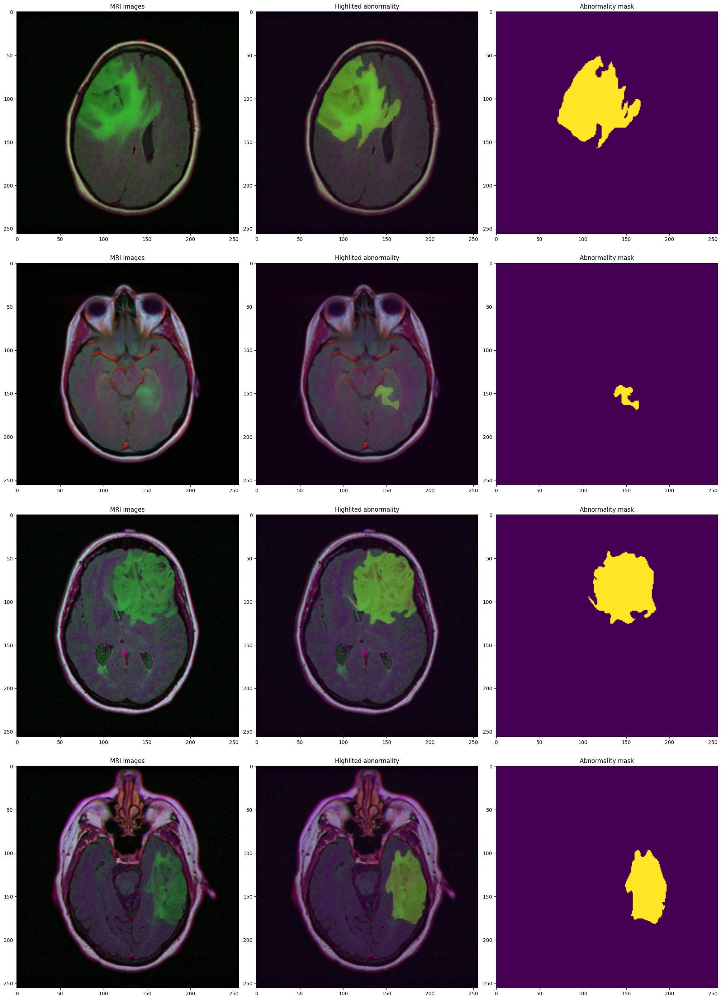

In [27]:
%matplotlib inline
n_examples = 4

fig, axs = plt.subplots(n_examples, 3, figsize=(20, n_examples*7), constrained_layout=True)
i = 0
for ax in axs:
    while True:
        image, mask = train_dataset.__getitem__(i, raw=True)
        i += 1
        if np.any(mask):
            ax[0].set_title("MRI images")
            ax[0].imshow(image)
            ax[1].set_title("Highlited abnormality")
            ax[1].imshow(image)
            ax[1].imshow(mask, alpha=0.2)
            ax[2].imshow(mask)
            ax[2].set_title("Abnormality mask")
            break




 Model Structure

In [28]:
class EarlyStopping():
    """
    Stops training when loss stops decreasing in a PyTorch module.
    """
    def __init__(self, patience:int = 6, min_delta: float = 0, weights_path: str = 'weights.pt'):
        """
        :param patience: number of epochs of non-decreasing loss before stopping
        :param min_delta: minimum difference between best and new loss that is considered
            an improvement
        :paran weights_path: Path to the file that should store the model's weights
        """
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = float('inf')
        self.weights_path = weights_path

    def __call__(self, val_loss: float, model: torch.nn.Module):
        if self.best_loss - val_loss > self.min_delta:
            self.best_loss = val_loss
            torch.save(model.state_dict(), self.weights_path)
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                return True
        return False

    def load_weights(self, model: torch.nn.Module):
        """
        Loads weights of the best model.
        :param model: model to which the weigths should be loaded
        """
        return model.load_state_dict(torch.load(self.weights_path))


In [29]:
def iou_pytorch(predictions: torch.Tensor, labels: torch.Tensor, e: float = 1e-7):
    """Calculates Intersection over Union for a tensor of predictions"""
    predictions = torch.where(predictions > 0.5, 1, 0)
    labels = labels.byte()

    intersection = (predictions & labels).float().sum((1, 2))
    union = (predictions | labels).float().sum((1, 2))

    iou = (intersection + e) / (union + e)
    return iou

def dice_pytorch(predictions: torch.Tensor, labels: torch.Tensor, e: float = 1e-7):
    """Calculates Dice coefficient for a tensor of predictions"""
    predictions = torch.where(predictions > 0.5, 1, 0)
    labels = labels.byte()

    intersection = (predictions & labels).float().sum((1, 2))
    return ((2 * intersection) + e) / (predictions.float().sum((1, 2)) + labels.float().sum((1, 2)) + e)

In [30]:
def BCE_dice(output, target, alpha=0.01):
    bce = torch.nn.functional.binary_cross_entropy(output, target)
    soft_dice = 1 - dice_pytorch(output, target).mean()
    return bce + alpha * soft_dice

In [31]:
### UNet Model with EfficientNetB7 as a backbone
model = smp.Unet(
    encoder_name="efficientnet-b7",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
    activation='sigmoid',
)
model.to(device);

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b7-dcc49843.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b7-dcc49843.pth
100%|██████████| 254M/254M [00:00<00:00, 318MB/s]


In [32]:
def training_loop(epochs, model, train_loader, valid_loader, optimizer, loss_fn, lr_scheduler):
    history = {'train_loss': [], 'val_loss': [], 'val_IoU': [], 'val_dice': []}
    early_stopping = EarlyStopping(patience=7)

    for epoch in range(1, epochs + 1):
        start_time = time.time()

        running_loss = 0
        model.train()
        for i, data in enumerate(tqdm(train_loader)):
            img, mask = data
            img, mask = img.to(device), mask.to(device)
            predictions = model(img)
            predictions = predictions.squeeze(1)
            loss = loss_fn(predictions, mask)
            running_loss += loss.item() * img.size(0)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

        model.eval()
        with torch.no_grad():
            running_IoU = 0
            running_dice = 0
            running_valid_loss = 0
            for i, data in enumerate(valid_loader):
                img, mask = data
                img, mask = img.to(device), mask.to(device)
                predictions = model(img)
                predictions = predictions.squeeze(1)
                running_dice += dice_pytorch(predictions, mask).sum().item()
                running_IoU += iou_pytorch(predictions, mask).sum().item()
                loss = loss_fn(predictions, mask)
                running_valid_loss += loss.item() * img.size(0)
        train_loss = running_loss / len(train_loader.dataset)
        val_loss = running_valid_loss / len(valid_loader.dataset)
        val_dice = running_dice / len(valid_loader.dataset)
        val_IoU = running_IoU / len(valid_loader.dataset)

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['val_IoU'].append(val_IoU)
        history['val_dice'].append(val_dice)
        print(f'Epoch: {epoch}/{epochs} | Training loss: {train_loss} | Validation loss: {val_loss} | Validation Mean IoU: {val_IoU} '
         f'| Validation Dice coefficient: {val_dice}')

        lr_scheduler.step(val_loss)
        if early_stopping(val_loss, model):
            early_stopping.load_weights(model)
            break
    model.eval()
    return history

In [33]:
loss_fn = BCE_dice
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 60
lr_scheduler = ReduceLROnPlateau(optimizer=optimizer, patience=2,factor=0.2)

history = training_loop(epochs, model, train_loader, valid_loader, optimizer, loss_fn, lr_scheduler)

100%|██████████| 172/172 [02:46<00:00,  1.04it/s]


Epoch: 1/60 | Training loss: 0.08374148241362789 | Validation loss: 0.042059449889397214 | Validation Mean IoU: 0.6851952867992853 | Validation Dice coefficient: 0.7096166796603445


100%|██████████| 172/172 [02:47<00:00,  1.03it/s]


Epoch: 2/60 | Training loss: 0.013669366101649675 | Validation loss: 0.019057655808026507 | Validation Mean IoU: 0.7260427685107215 | Validation Dice coefficient: 0.7620967509382862


100%|██████████| 172/172 [02:48<00:00,  1.02it/s]


Epoch: 3/60 | Training loss: 0.009404605098746039 | Validation loss: 0.008304258701154742 | Validation Mean IoU: 0.8524538266456734 | Validation Dice coefficient: 0.8834614996182717


100%|██████████| 172/172 [02:48<00:00,  1.02it/s]


Epoch: 4/60 | Training loss: 0.0073104805455289105 | Validation loss: 0.0284147327899996 | Validation Mean IoU: 0.8065066208273678 | Validation Dice coefficient: 0.8295041682356495


100%|██████████| 172/172 [02:48<00:00,  1.02it/s]


Epoch: 5/60 | Training loss: 0.005843540204858238 | Validation loss: 0.005953645472556858 | Validation Mean IoU: 0.8958382784310034 | Validation Dice coefficient: 0.9229857202303612


100%|██████████| 172/172 [02:48<00:00,  1.02it/s]


Epoch: 6/60 | Training loss: 0.005043053861368786 | Validation loss: 0.0059870520148868275 | Validation Mean IoU: 0.8851027585692325 | Validation Dice coefficient: 0.9132120019298489


100%|██████████| 172/172 [02:48<00:00,  1.02it/s]


Epoch: 7/60 | Training loss: 0.004438783638517965 | Validation loss: 0.005886027436324601 | Validation Mean IoU: 0.8874221914905612 | Validation Dice coefficient: 0.9149922370910645


100%|██████████| 172/172 [02:48<00:00,  1.02it/s]


Epoch: 8/60 | Training loss: 0.004152652814306996 | Validation loss: 0.005886250884287943 | Validation Mean IoU: 0.886301658113124 | Validation Dice coefficient: 0.9142862740209547


100%|██████████| 172/172 [02:48<00:00,  1.02it/s]


Epoch: 9/60 | Training loss: 0.004053844289346175 | Validation loss: 0.006207715202186067 | Validation Mean IoU: 0.88960026078305 | Validation Dice coefficient: 0.9170642982094975


100%|██████████| 172/172 [02:49<00:00,  1.02it/s]


Epoch: 10/60 | Training loss: 0.007231205813925374 | Validation loss: 0.13527085826558582 | Validation Mean IoU: 0.8419897095631745 | Validation Dice coefficient: 0.8707881377915204


100%|██████████| 172/172 [02:48<00:00,  1.02it/s]


Epoch: 11/60 | Training loss: 0.004320500677620823 | Validation loss: 0.09322208851197009 | Validation Mean IoU: 0.8419274346303132 | Validation Dice coefficient: 0.868006827467579


100%|██████████| 172/172 [02:48<00:00,  1.02it/s]


Epoch: 12/60 | Training loss: 0.0037149712103842335 | Validation loss: 0.008129007422949298 | Validation Mean IoU: 0.8821691238274009 | Validation Dice coefficient: 0.9076016814021741


100%|██████████| 172/172 [02:48<00:00,  1.02it/s]


Epoch: 13/60 | Training loss: 0.0035083543444898997 | Validation loss: 0.005641509985582808 | Validation Mean IoU: 0.8914300950907045 | Validation Dice coefficient: 0.9172325958639889


100%|██████████| 172/172 [02:48<00:00,  1.02it/s]


Epoch: 14/60 | Training loss: 0.0033426304569637235 | Validation loss: 0.005950508179079931 | Validation Mean IoU: 0.8944253210294044 | Validation Dice coefficient: 0.9203334129462808


100%|██████████| 172/172 [02:48<00:00,  1.02it/s]


Epoch: 15/60 | Training loss: 0.003184468597173691 | Validation loss: 0.005756432763537613 | Validation Mean IoU: 0.8954257560988604 | Validation Dice coefficient: 0.9211721775895458


100%|██████████| 172/172 [02:48<00:00,  1.02it/s]


Epoch: 16/60 | Training loss: 0.003054701972583478 | Validation loss: 0.005712327045404305 | Validation Mean IoU: 0.8974312733795683 | Validation Dice coefficient: 0.9233397031234483


100%|██████████| 172/172 [02:49<00:00,  1.02it/s]


Epoch: 17/60 | Training loss: 0.0029356519163332203 | Validation loss: 0.0057305939258786584 | Validation Mean IoU: 0.8934431851920435 | Validation Dice coefficient: 0.919678507012836


100%|██████████| 172/172 [02:48<00:00,  1.02it/s]


Epoch: 18/60 | Training loss: 0.0028662467551502317 | Validation loss: 0.005776713553310956 | Validation Mean IoU: 0.8936179468187235 | Validation Dice coefficient: 0.9198840658543473


100%|██████████| 172/172 [02:48<00:00,  1.02it/s]


Epoch: 19/60 | Training loss: 0.0028672933224588634 | Validation loss: 0.005873053025264861 | Validation Mean IoU: 0.8940386044777046 | Validation Dice coefficient: 0.9200401338480286


100%|██████████| 172/172 [02:48<00:00,  1.02it/s]


Epoch: 20/60 | Training loss: 0.0028314840194176545 | Validation loss: 0.0058742519894267545 | Validation Mean IoU: 0.8923699847722457 | Validation Dice coefficient: 0.9184127839945131


Evaluation

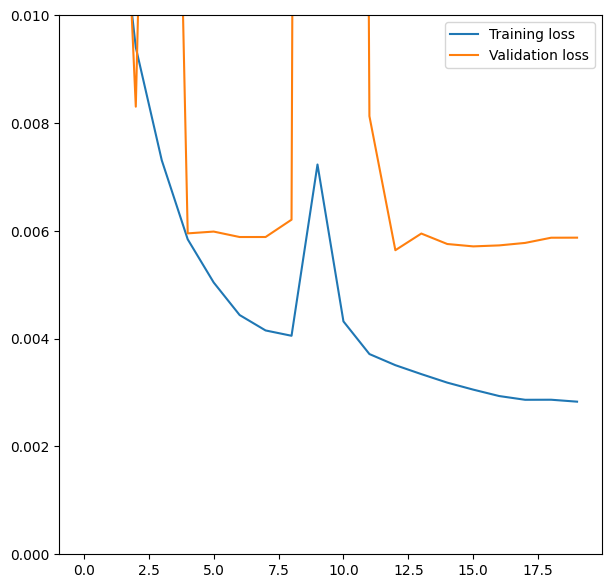

In [34]:
plt.figure(figsize=(7, 7))
plt.plot(history['train_loss'], label='Training loss')
plt.plot(history['val_loss'], label='Validation loss')
plt.ylim(0, 0.01)
plt.legend()
plt.show()

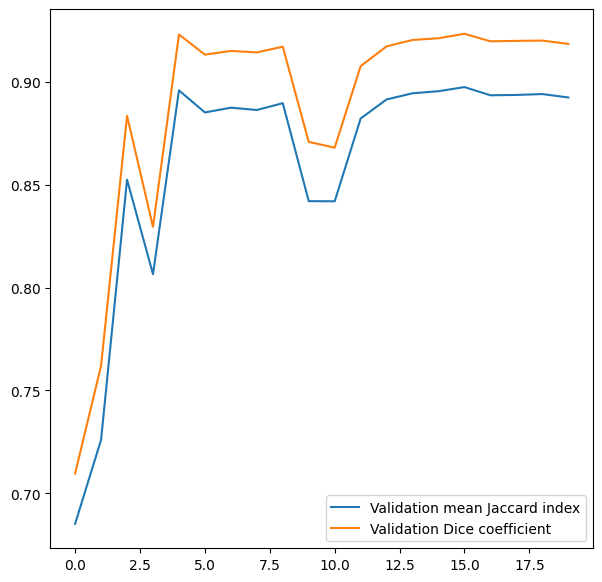

In [35]:
plt.figure(figsize=(7, 7))
plt.plot(history['val_IoU'], label='Validation mean Jaccard index')
plt.plot(history['val_dice'], label='Validation Dice coefficient')
plt.legend()
plt.show()

 Test Evaluation

In [36]:
with torch.no_grad():
    running_IoU = 0
    running_dice = 0
    running_loss = 0
    for i, data in enumerate(test_loader):
        img, mask = data
        img, mask = img.to(device), mask.to(device)
        predictions = model(img)
        predictions = predictions.squeeze(1)
        running_dice += dice_pytorch(predictions, mask).sum().item()
        running_IoU += iou_pytorch(predictions, mask).sum().item()
        loss = loss_fn(predictions, mask)
        running_loss += loss.item() * img.size(0)
    loss = running_loss / len(test_dataset)
    dice = running_dice / len(test_dataset)
    IoU = running_IoU / len(test_dataset)

    print(f'Tests: loss: {loss} | Mean IoU: {IoU} | Dice coefficient: {dice}')

Tests: loss: 0.005820524185422155 | Mean IoU: 0.8947756689831474 | Dice coefficient: 0.921646252824987


Testing

<ipython-input-37-9760976156a2>:22: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  prediction_edges = prediction - binary_dilation(prediction)
<ipython-input-37-9760976156a2>:23: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  ground_truth = mask - binary_dilation(mask)


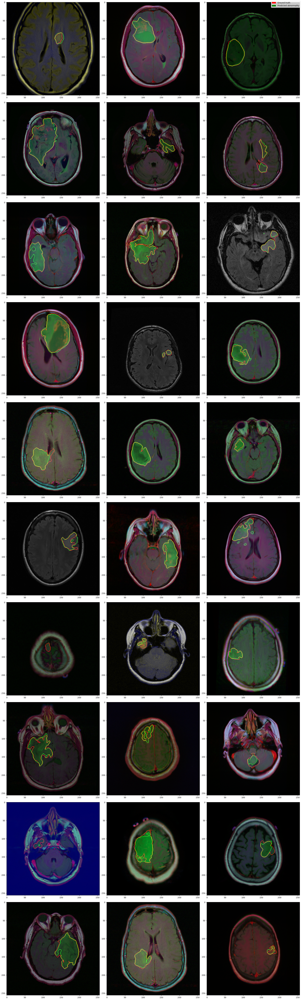

In [37]:
%matplotlib inline

width = 3
columns = 10
n_examples = columns * width

fig, axs = plt.subplots(columns, width, figsize=(7*width , 7*columns), constrained_layout=True)
red_patch = mpatches.Patch(color='red', label='The red data')
fig.legend(loc='upper right',handles=[
    mpatches.Patch(color='red', label='Ground truth'),
    mpatches.Patch(color='green', label='Predicted abnormality')])
i = 0
with torch.no_grad():
    for data in test_loader:
        image, mask = data
        mask = mask[0]
        if not mask.byte().any():
            continue
        image = image.to(device)
        prediction = model(image).to('cpu')[0][0]
        prediction = torch.where(prediction > 0.5, 1, 0)
        prediction_edges = prediction - binary_dilation(prediction)
        ground_truth = mask - binary_dilation(mask)
        image[0, 0, ground_truth.bool()] = 1
        image[0, 1, prediction_edges.bool()] = 1

        axs[i//width][i%width].imshow(image[0].to('cpu').permute(1, 2, 0))
        if n_examples == i + 1:
            break
        i += 1
